In [ ]:
import cv2
import numpy as np
import glob

# Chessboard dimensions
chessboard_size = (9, 6)  # 9x6 corners
square_size = 1.0  # Size of a square (arbitrary units)

# Prepare object points (3D points)
objp = np.zeros((chessboard_size[0] * chessboard_size[1], 3), np.float32)
objp[:, :2] = np.mgrid[0:chessboard_size[0], 0:chessboard_size[1]].T.reshape(-1, 2)
objp *= square_size

# Arrays to store object points and image points
obj_points = []  # 3D points in real-world space
img_points = []  # 2D points in image plane

# Load images for calibration
images = glob.glob('calibration_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, chessboard_size, None)

    if ret:
        obj_points.append(objp)
        img_points.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, chessboard_size, corners, ret)
        cv2.imshow('Chessboard Corners', img)
        cv2.waitKey(500)

cv2.destroyAllWindows()

# Camera calibration
ret, camera_matrix, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(obj_points, img_points, gray.shape[::-1], None, None)

# Example: Undistort an image
img = cv2.imread('calibration_images/image1.jpg')
h, w = img.shape[:2]
new_camera_matrix, roi = cv2.getOptimalNewCameraMatrix(camera_matrix, dist_coeffs, (w, h), 1, (w, h))

# Undistort
dst = cv2.undistort(img, camera_matrix, dist_coeffs, None, new_camera_matrix)

# Crop the image (if necessary)
x, y, w, h = roi
dst = dst[y:y+h, x:x+w]
cv2.imshow('Undistorted Image', dst)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [1]:
#!/usr/bin/env python

import cv2
import numpy as np
import os
import glob

# Defining the dimensions of checkerboard
CHECKERBOARD = (6,9)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Creating vector to store vectors of 3D points for each checkerboard image
objpoints = []
# Creating vector to store vectors of 2D points for each checkerboard image
imgpoints = [] 


# Defining the world coordinates for 3D points
objp = np.zeros((1, CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None

# Extracting path of individual image stored in a given directory
images = glob.glob('./images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    # Find the chess board corners
    # If desired number of corners are found in the image then ret = true
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH+
    	cv2.CALIB_CB_FAST_CHECK+cv2.CALIB_CB_NORMALIZE_IMAGE)
    
    """
    If desired number of corner are detected,
    we refine the pixel coordinates and display 
    them on the images of checker board
    """
    if ret == True:
        objpoints.append(objp)
        # refining pixel coordinates for given 2d points.
        corners2 = cv2.cornerSubPix(gray,corners,(11,11),(-1,-1),criteria)
        
        imgpoints.append(corners2)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2,ret)
    
    cv2.imshow('img',img)
    cv2.waitKey(0)

cv2.destroyAllWindows()

h,w = img.shape[:2]

"""
Performing camera calibration by 
passing the value of known 3D points (objpoints)
and corresponding pixel coordinates of the 
detected corners (imgpoints)
"""
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

print("Camera matrix : \n")
print(mtx)
print("dist : \n")
print(dist)
print("rvecs : \n")
print(rvecs)
print("tvecs : \n")
print(tvecs)

KeyboardInterrupt: 

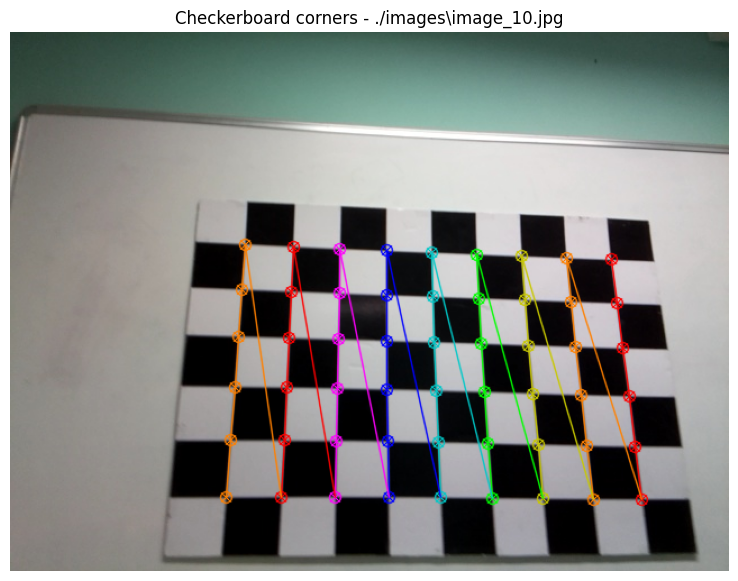

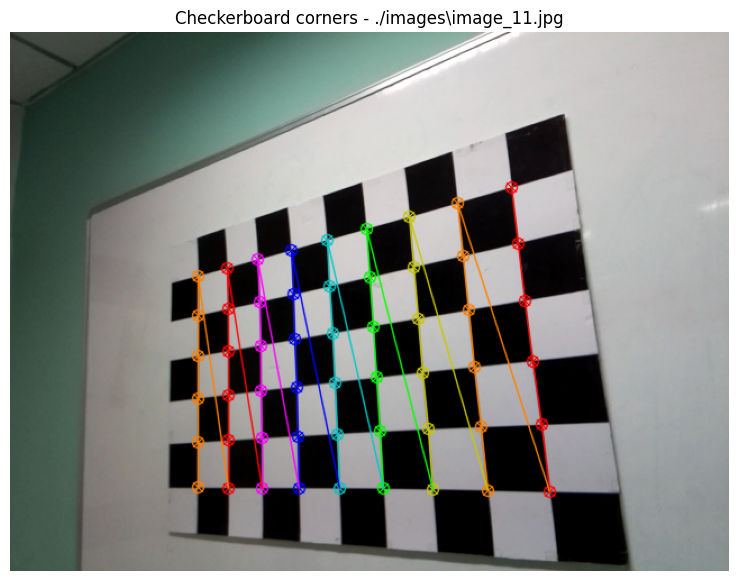

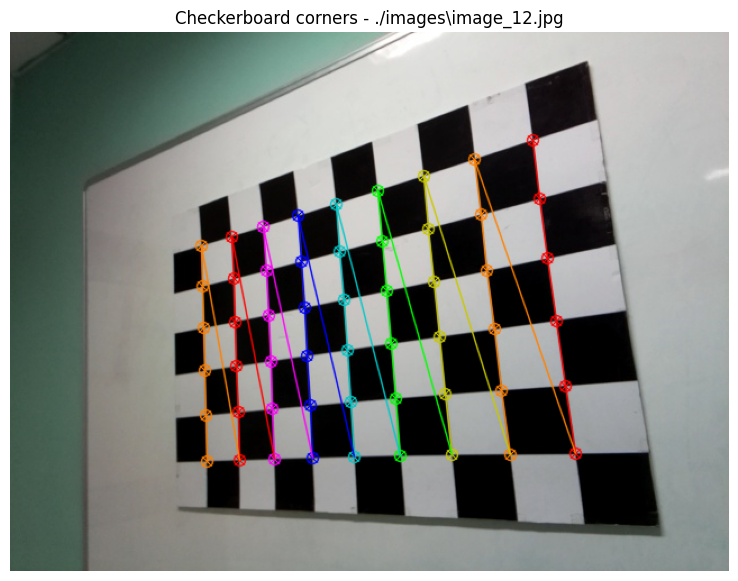

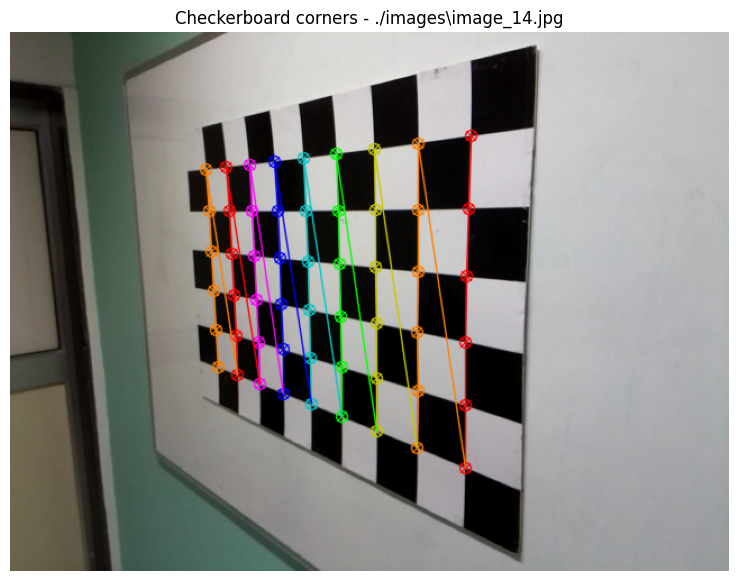

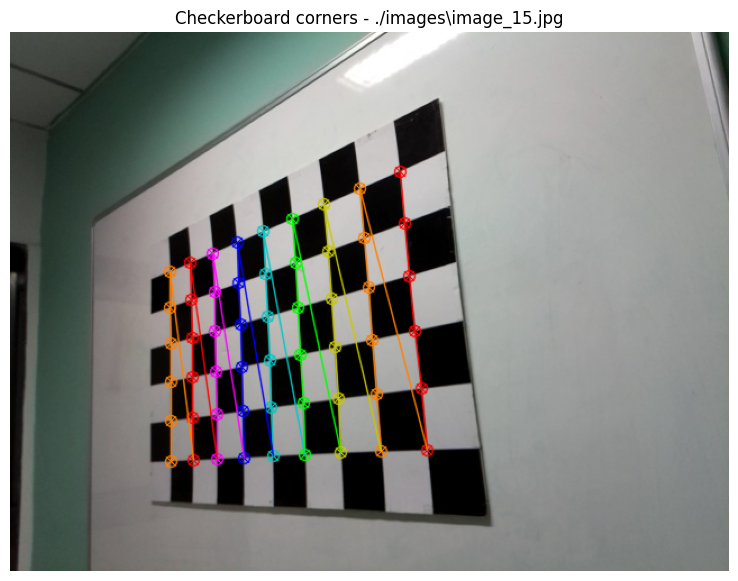

...

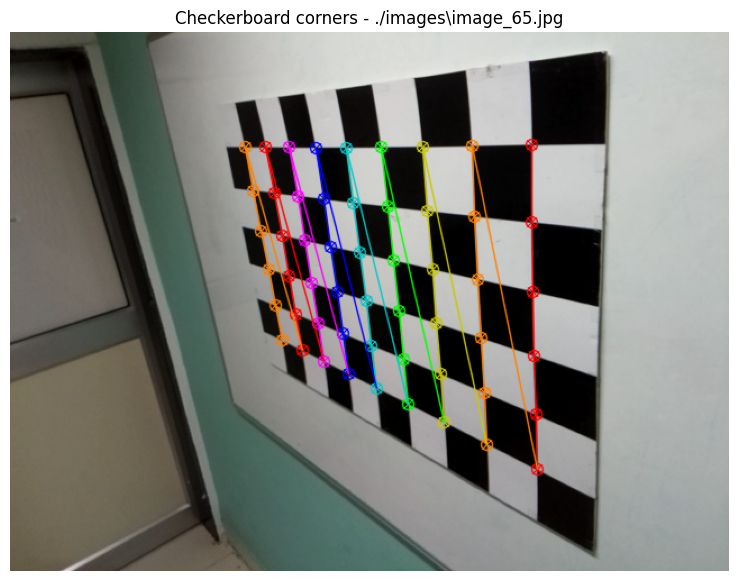

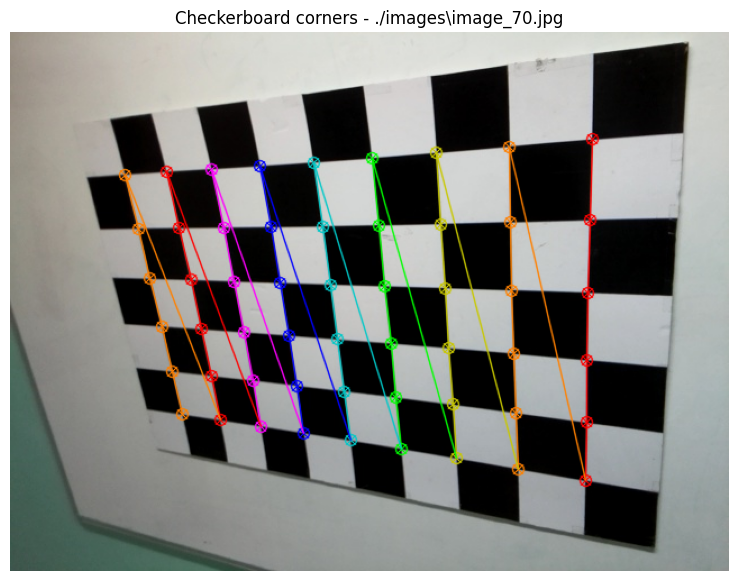

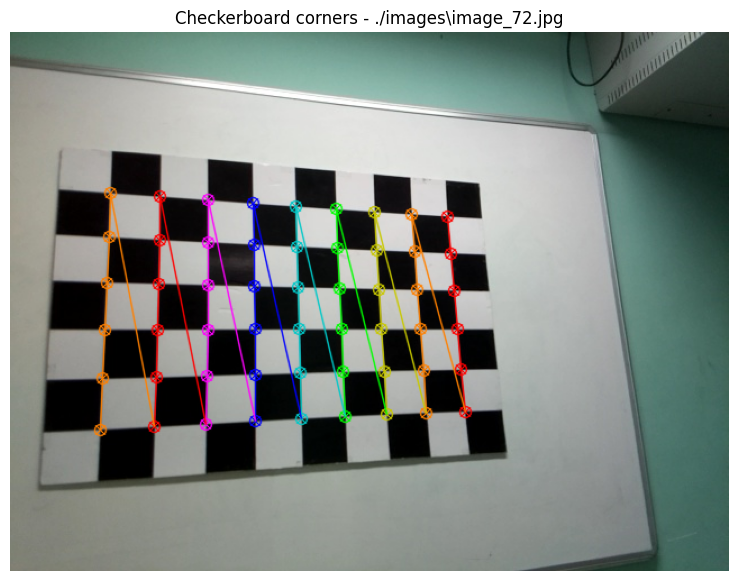

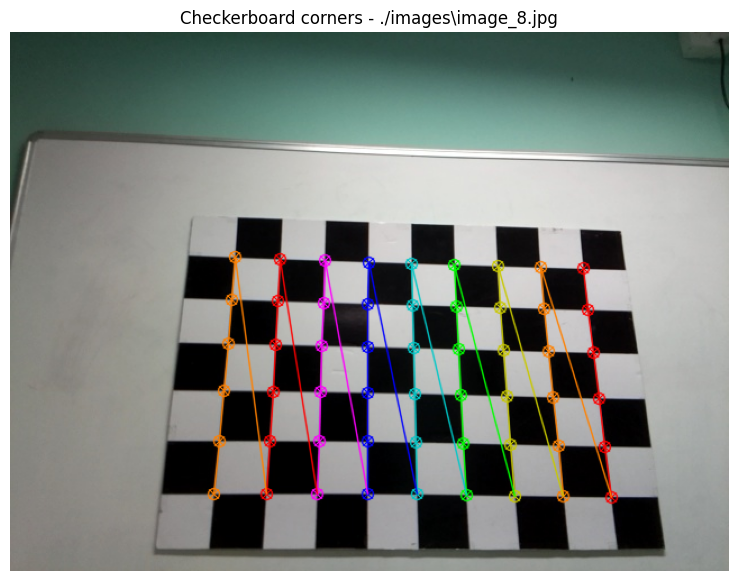

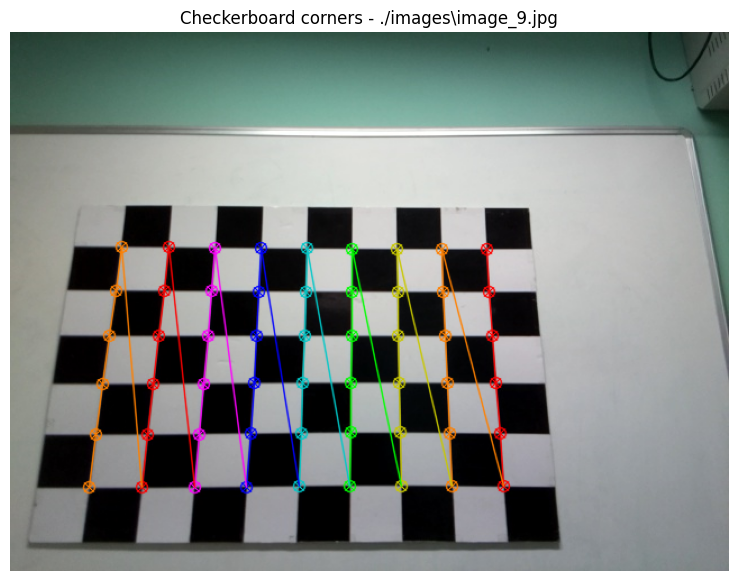

Camera matrix: 
 [[503.68477278   0.         313.67563674]
 [  0.         503.37989194 243.25575476]
 [  0.           0.           1.        ]]
Distortion coefficients: 
 [[ 2.08346324e-01 -4.68650266e-01  4.51079181e-04 -1.93373893e-03
   2.37592401e-01]]
Rotation vectors: 
 (array([[-0.31060359],
       [ 0.1515558 ],
       [ 1.57720394]]), array([[0.3139181 ],
       [0.58736866],
       [1.39910762]]), array([[0.33307297],
       [0.55841704],
       [1.39532836]]), array([[0.78743976],
       [0.53294469],
       [1.52233962]]), array([[0.42519317],
       [0.68127945],
       [1.34442524]]), array([[-0.40676505],
       [-0.72194813],
       [ 1.36334531]]), array([[-0.41607396],
       [-0.7647259 ],
       [ 1.33850247]]), array([[-0.23343341],
       [-0.04621596],
       [ 1.522275  ]]), array([[ 0.11068043],
       [-0.46502899],
       [ 1.48272651]]), array([[0.84715318],
       [0.19610195],
       [1.46485457]]), array([[0.28284572],
       [0.58780705],
       [1.31948

In [2]:
#!/usr/bin/env python

import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt

CHECKERBOARD = (6,9)
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Creating vector to store vectors of 3D points for each checkerboard image
objpoints = []
# Creating vector to store vectors of 2D points for each checkerboard image
imgpoints = [] 

# Defining the world coordinates for 3D points
objp = np.zeros((1, CHECKERBOARD[0]*CHECKERBOARD[1], 3), np.float32)
objp[0,:,:2] = np.mgrid[0:CHECKERBOARD[0], 0:CHECKERBOARD[1]].T.reshape(-1, 2)
prev_img_shape = None

# Extracting path of individual image stored in a given directory
images = glob.glob('./images/*.jpg')
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chess board corners
    ret, corners = cv2.findChessboardCorners(gray, CHECKERBOARD, cv2.CALIB_CB_ADAPTIVE_THRESH +
                                             cv2.CALIB_CB_FAST_CHECK + cv2.CALIB_CB_NORMALIZE_IMAGE)
    
    # If desired number of corners are detected
    if ret == True:
        objpoints.append(objp)
        # Refining pixel coordinates for given 2d points
        corners2 = cv2.cornerSubPix(gray, corners, (11,11), (-1,-1), criteria)
        imgpoints.append(corners2)

        # Draw and display the corners on the original image
        img = cv2.drawChessboardCorners(img, CHECKERBOARD, corners2, ret)
        
        # Convert image from BGR to RGB for displaying using Matplotlib
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Display the image using Matplotlib
        plt.figure(figsize=(10, 7))
        plt.imshow(img_rgb)
        plt.title(f'Checkerboard corners - {fname}')
        plt.axis('off')
        plt.show()

# Perform camera calibration
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

print("Camera matrix: \n", mtx)
print("Distortion coefficients: \n", dist)
print("Rotation vectors: \n", rvecs)
print("Translation vectors: \n", tvecs)


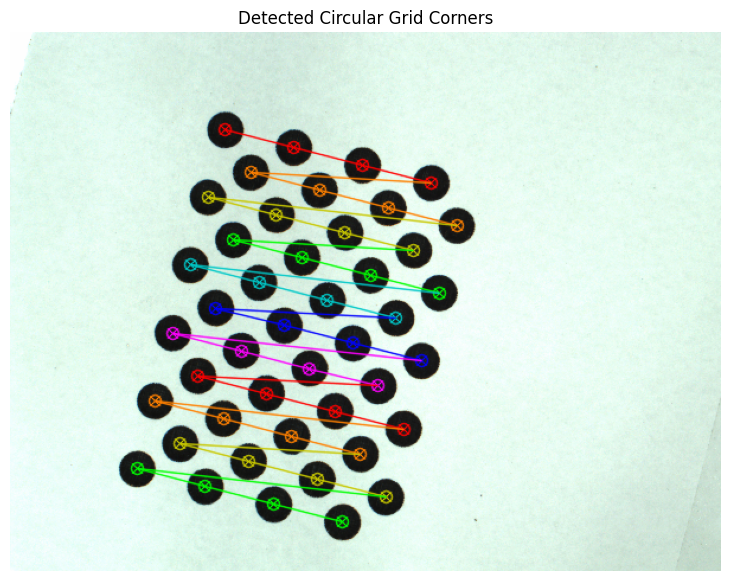

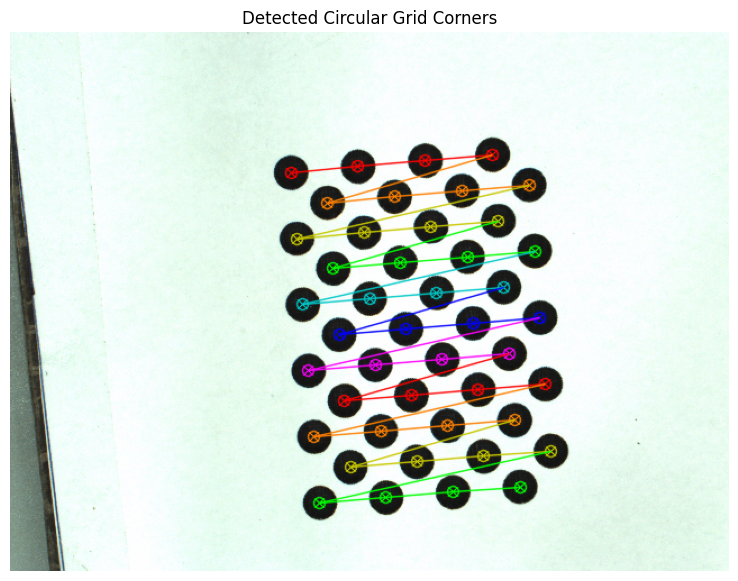

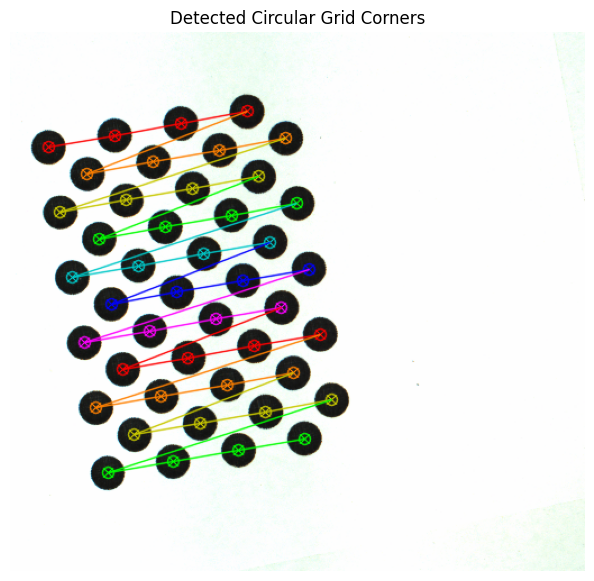

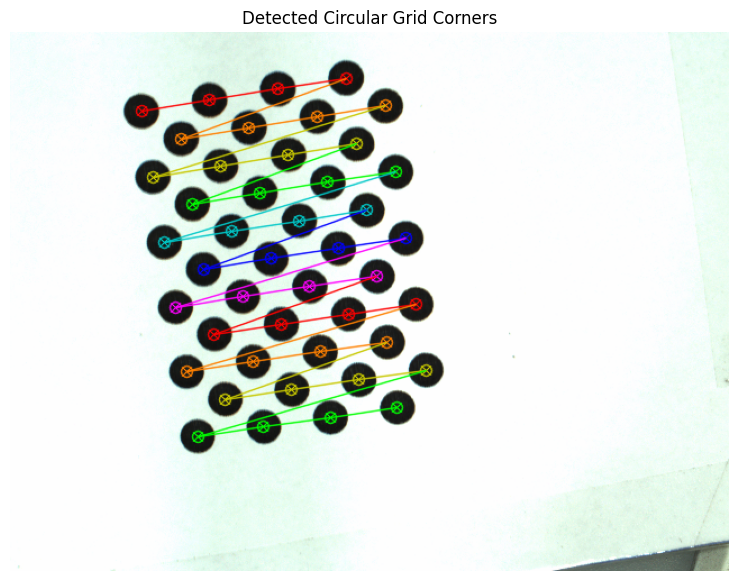

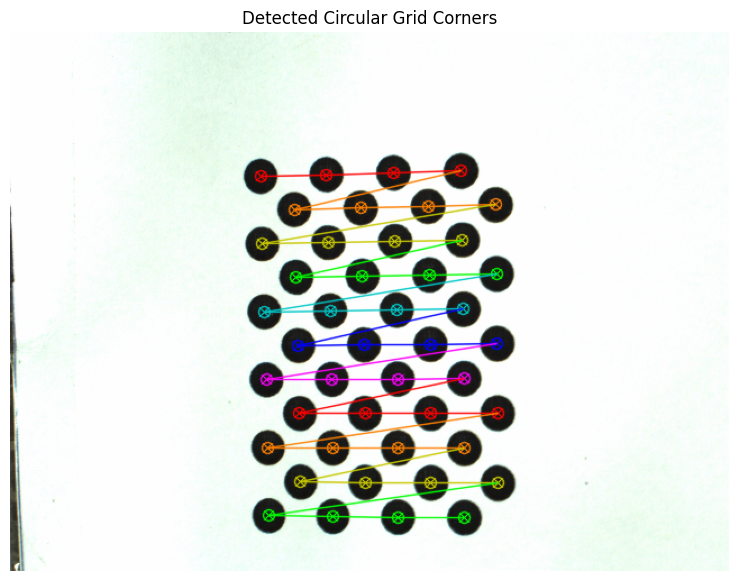

Error in projection : 
 0.28397138993192417

Camera matrix : 
 [[ 2.98018946e+03  0.00000000e+00 -2.07790644e+02]
 [ 0.00000000e+00  2.98680309e+03  5.80328416e+02]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]

Distortion coefficients : 
 [[-1.38990879e+00  1.28121501e+01 -1.76642504e-02  4.92392900e-02
  -6.65051660e+01]]

Rotation vector : 
 (array([[1.98945525],
       [2.57035288],
       [0.00544978]]), array([[-2.141599  ],
       [-1.96709247],
       [ 0.1071076 ]]), array([[-2.30654667],
       [-1.91925376],
       [-0.09466172]]), array([[-2.14337584],
       [-1.80887689],
       [-0.09635144]]), array([[-1.89996746],
       [-1.89926953],
       [ 0.33507546]]))

Translation vector : 
 (array([[ 465.62345471],
       [-601.35082796],
       [3539.69468578]]), array([[ 549.35638975],
       [-550.85288875],
       [3547.04309867]]), array([[ 286.79704145],
       [-575.92278998],
       [3538.10081969]]), array([[ 379.75106914],
       [-604.7774144 ],
       [3469.4

In [6]:
# imports
import numpy as np
import cv2 as cv
import glob
import matplotlib.pyplot as plt

# termination criteria
criteria = (cv.TERM_CRITERIA_EPS + cv.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Real world coordinates of circular grid
obj3d = np.zeros((44, 3), np.float32)
# As the actual circle size is not required,
# the z-coordinate is zero and the x and y coordinates are random numbers.
a = [0, 36, 72, 108, 144, 180, 216, 252, 288, 324, 360]
b = [0, 72, 144, 216, 36, 108, 180, 252]
for i in range(0, 44):
    obj3d[i] = (a[i // 4], (b[i % 8]), 0)

# Vector to store 3D points
obj_points = []
# Vector to store 2D points
img_points = []

# Extracting path of individual images stored in a given directory
images = glob.glob('./cimages/*.png')

for f in images:
    # Loading image
    img = cv.imread(f)
    # Conversion to grayscale image
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # To find the position of circles in the grid pattern
    ret, corners = cv.findCirclesGrid(gray, (4, 11), None, flags=cv.CALIB_CB_ASYMMETRIC_GRID)

    # If true is returned, then 3D and 2D vector points are updated and corner is drawn on image
    if ret == True:
        obj_points.append(obj3d)
        corners2 = cv.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        img_points.append(corners2)

        # Drawing the corners on the image
        cv.drawChessboardCorners(img, (4, 11), corners2, ret)

        # Convert BGR to RGB for Matplotlib
        img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

        # Display the image with corners using Matplotlib
        plt.figure(figsize=(10, 7))
        plt.imshow(img_rgb)
        plt.title('Detected Circular Grid Corners')
        plt.axis('off')
        plt.show()

# Camera calibration: 
# Passing the value of known 3D points (obj_points) and the corresponding pixel coordinates 
# of the detected corners (img_points)
ret, camera_mat, distortion, rotation_vecs, translation_vecs = cv.calibrateCamera(
    obj_points, img_points, gray.shape[::-1], None, None)

print("Error in projection : \n", ret)
print("\nCamera matrix : \n", camera_mat)
print("\nDistortion coefficients : \n", distortion)
print("\nRotation vector : \n", rotation_vecs)
print("\nTranslation vector : \n", translation_vecs)
